Comprehensive Exploratory Data Analysis (EDA) - Breast Cancer Dataset

Level 2 Analysis: Basic, Intermediate, and Advanced

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
import warnings
warnings.filterwarnings('ignore')

#1. DATA LOADING AND PREPROCESSING

In [15]:
print("\n" + "="*80)
print("1. DATA LOADING AND PREPROCESSING")
print("="*80)


1. DATA LOADING AND PREPROCESSING


In [16]:
# Remove the first unnamed column (index column)
df = df.iloc[:, 1:]

In [17]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Breast cancer EDA/brca.csv")

In [18]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           569 non-null    int64  
 1   x.radius_mean        569 non-null    float64
 2   x.texture_mean       569 non-null    float64
 3   x.perimeter_mean     569 non-null    float64
 4   x.area_mean          569 non-null    float64
 5   x.smoothness_mean    569 non-null    float64
 6   x.compactness_mean   569 non-null    float64
 7   x.concavity_mean     569 non-null    float64
 8   x.concave_pts_mean   569 non-null    float64
 9   x.symmetry_mean      569 non-null    float64
 10  x.fractal_dim_mean   569 non-null    float64
 11  x.radius_se          569 non-null    float64
 12  x.texture_se         569 non-null    float64
 13  x.perimeter_se       569 non-null    float64
 14  x.area_se            569 non-null    float64
 15  x.smoothness_se      569 non-null    flo

In [19]:
# Load dataset
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Breast cancer EDA/brca.csv")
print(df.describe())

       Unnamed: 0  x.radius_mean  x.texture_mean  x.perimeter_mean  \
count  569.000000     569.000000      569.000000        569.000000   
mean   285.000000      14.127292       19.289649         91.969033   
std    164.400426       3.524049        4.301036         24.298981   
min      1.000000       6.981000        9.710000         43.790000   
25%    143.000000      11.700000       16.170000         75.170000   
50%    285.000000      13.370000       18.840000         86.240000   
75%    427.000000      15.780000       21.800000        104.100000   
max    569.000000      28.110000       39.280000        188.500000   

       x.area_mean  x.smoothness_mean  x.compactness_mean  x.concavity_mean  \
count   569.000000         569.000000          569.000000        569.000000   
mean    654.889104           0.096360            0.104341          0.088799   
std     351.914129           0.014064            0.052813          0.079720   
min     143.500000           0.052630            0.01

In [20]:
print(df.head())

   Unnamed: 0  x.radius_mean  x.texture_mean  x.perimeter_mean  x.area_mean  \
0           1         13.540           14.36             87.46        566.3   
1           2         13.080           15.71             85.63        520.0   
2           3          9.504           12.44             60.34        273.9   
3           4         13.030           18.42             82.61        523.8   
4           5          8.196           16.84             51.71        201.9   

   x.smoothness_mean  x.compactness_mean  x.concavity_mean  \
0            0.09779             0.08129           0.06664   
1            0.10750             0.12700           0.04568   
2            0.10240             0.06492           0.02956   
3            0.08983             0.03766           0.02562   
4            0.08600             0.05943           0.01588   

   x.concave_pts_mean  x.symmetry_mean  ...  x.texture_worst  \
0            0.047810           0.1885  ...            19.26   
1            0.031100   

In [21]:
print(df.tail())

     Unnamed: 0  x.radius_mean  x.texture_mean  x.perimeter_mean  x.area_mean  \
564         565          20.92           25.09             143.0       1347.0   
565         566          21.56           22.39             142.0       1479.0   
566         567          20.13           28.25             131.2       1261.0   
567         568          16.60           28.08             108.3        858.1   
568         569          20.60           29.33             140.1       1265.0   

     x.smoothness_mean  x.compactness_mean  x.concavity_mean  \
564            0.10990              0.2236           0.31740   
565            0.11100              0.1159           0.24390   
566            0.09780              0.1034           0.14400   
567            0.08455              0.1023           0.09251   
568            0.11780              0.2770           0.35140   

     x.concave_pts_mean  x.symmetry_mean  ...  x.texture_worst  \
564             0.14740           0.2149  ...            29.41

In [22]:
print(df.columns)

Index(['Unnamed: 0', 'x.radius_mean', 'x.texture_mean', 'x.perimeter_mean',
       'x.area_mean', 'x.smoothness_mean', 'x.compactness_mean',
       'x.concavity_mean', 'x.concave_pts_mean', 'x.symmetry_mean',
       'x.fractal_dim_mean', 'x.radius_se', 'x.texture_se', 'x.perimeter_se',
       'x.area_se', 'x.smoothness_se', 'x.compactness_se', 'x.concavity_se',
       'x.concave_pts_se', 'x.symmetry_se', 'x.fractal_dim_se',
       'x.radius_worst', 'x.texture_worst', 'x.perimeter_worst',
       'x.area_worst', 'x.smoothness_worst', 'x.compactness_worst',
       'x.concavity_worst', 'x.concave_pts_worst', 'x.symmetry_worst',
       'x.fractal_dim_worst', 'y'],
      dtype='object')


In [23]:
print(len(df))

569


In [24]:
print(df.shape)

(569, 32)


In [25]:
# Basic info
print(f"\n  Data Types:")
print(df.dtypes.value_counts())


  Data Types:
float64    30
int64       1
object      1
Name: count, dtype: int64


In [26]:
#for missing values
print(df.isnull().sum())

Unnamed: 0             0
x.radius_mean          0
x.texture_mean         0
x.perimeter_mean       0
x.area_mean            0
x.smoothness_mean      0
x.compactness_mean     0
x.concavity_mean       0
x.concave_pts_mean     0
x.symmetry_mean        0
x.fractal_dim_mean     0
x.radius_se            0
x.texture_se           0
x.perimeter_se         0
x.area_se              0
x.smoothness_se        0
x.compactness_se       0
x.concavity_se         0
x.concave_pts_se       0
x.symmetry_se          0
x.fractal_dim_se       0
x.radius_worst         0
x.texture_worst        0
x.perimeter_worst      0
x.area_worst           0
x.smoothness_worst     0
x.compactness_worst    0
x.concavity_worst      0
x.concave_pts_worst    0
x.symmetry_worst       0
x.fractal_dim_worst    0
y                      0
dtype: int64


In [27]:
#Missing Value %tage
print((df.isnull().sum() / len(df)) * 100)

Unnamed: 0             0.0
x.radius_mean          0.0
x.texture_mean         0.0
x.perimeter_mean       0.0
x.area_mean            0.0
x.smoothness_mean      0.0
x.compactness_mean     0.0
x.concavity_mean       0.0
x.concave_pts_mean     0.0
x.symmetry_mean        0.0
x.fractal_dim_mean     0.0
x.radius_se            0.0
x.texture_se           0.0
x.perimeter_se         0.0
x.area_se              0.0
x.smoothness_se        0.0
x.compactness_se       0.0
x.concavity_se         0.0
x.concave_pts_se       0.0
x.symmetry_se          0.0
x.fractal_dim_se       0.0
x.radius_worst         0.0
x.texture_worst        0.0
x.perimeter_worst      0.0
x.area_worst           0.0
x.smoothness_worst     0.0
x.compactness_worst    0.0
x.concavity_worst      0.0
x.concave_pts_worst    0.0
x.symmetry_worst       0.0
x.fractal_dim_worst    0.0
y                      0.0
dtype: float64


In [28]:
#Handling Missing Values
df.fillna(df.mean(numeric_only=True), inplace=True)

In [29]:
# Check for missing values
print(f"\n  Missing Values:")
missing = df.isnull().sum()
if missing.sum() == 0:
    print("    ✓ No missing values detected!")
else:
    print(missing[missing > 0])


  Missing Values:
    ✓ No missing values detected!


In [30]:
#Fill Catogarcal Columns With Mode
for col in df.select_dtypes(include=['object']):
    df[col] = df[col].fillna(df[col].mode()[0])

In [31]:
#chk duplicate records
print(df.duplicated().sum())

0


In [32]:
# Check for duplicates
duplicates = df.duplicated().sum()
print(f"\n  Duplicate Rows: {duplicates}")


  Duplicate Rows: 0


In [33]:
#remove duplicates
df.drop_duplicates(inplace=True)

In [34]:
#Data type summary table
data_types = pd.DataFrame({
    "Column Name": df.columns,
    "Data Type": df.dtypes
})
data_types

,Column Name,Data Type
Unnamed: 0,Unnamed: 0,int64
x.radius_mean,x.radius_mean,float64
x.texture_mean,x.texture_mean,float64
x.perimeter_mean,x.perimeter_mean,float64
x.area_mean,x.area_mean,float64
x.smoothness_mean,x.smoothness_mean,float64
x.compactness_mean,x.compactness_mean,float64
x.concavity_mean,x.concavity_mean,float64
x.concave_pts_mean,x.concave_pts_mean,float64
x.symmetry_mean,x.symmetry_mean,float64


In [35]:
# Target variable analysis
print(f"\n  Target Variable (y):")
print(f"    {df['y'].value_counts()}")
print(f"\n    Distribution:")
print(f"    {df['y'].value_counts(normalize=True) * 100}")


  Target Variable (y):
    y
B    357
M    212
Name: count, dtype: int64

    Distribution:
    y
B    62.741652
M    37.258348
Name: proportion, dtype: float64


# 2. BASIC ANALYSIS

In [36]:
print("\n" + "="*80)
print("2. BASIC ANALYSIS")
print("="*80)


2. BASIC ANALYSIS


In [37]:
# Descriptive statistics
print("\n  Descriptive Statistics (First 5 features):")
print(df.iloc[:, :5].describe())


  Descriptive Statistics (First 5 features):
       Unnamed: 0  x.radius_mean  x.texture_mean  x.perimeter_mean  \
count  569.000000     569.000000      569.000000        569.000000   
mean   285.000000      14.127292       19.289649         91.969033   
std    164.400426       3.524049        4.301036         24.298981   
min      1.000000       6.981000        9.710000         43.790000   
25%    143.000000      11.700000       16.170000         75.170000   
50%    285.000000      13.370000       18.840000         86.240000   
75%    427.000000      15.780000       21.800000        104.100000   
max    569.000000      28.110000       39.280000        188.500000   

       x.area_mean  
count   569.000000  
mean    654.889104  
std     351.914129  
min     143.500000  
25%     420.300000  
50%     551.100000  
75%     782.700000  
max    2501.000000  


In [38]:
# Separate features by type (mean, se, worst)
mean_features = [col for col in df.columns if 'mean' in col]
se_features = [col for col in df.columns if 'se' in col]
worst_features = [col for col in df.columns if 'worst' in col]

print(f"\n  Feature Categories:")
print(f"    Mean features: {len(mean_features)}")
print(f"    Standard Error features: {len(se_features)}")
print(f"    Worst features: {len(worst_features)}")


  Feature Categories:
    Mean features: 10
    Standard Error features: 10
    Worst features: 10


In [39]:
# Create visualizations
fig = plt.figure(figsize=(20, 12))

<Figure size 2000x1200 with 0 Axes>

Text(0.5, 1.0, 'Target Distribution\n(Diagnosis)')

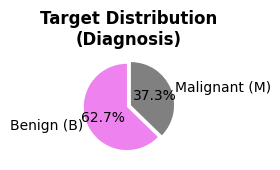

In [40]:
# 2.1 Target Distribution
plt.subplot(3, 4, 1)
target_counts = df['y'].value_counts()
colors = ['violet', 'gray']
plt.pie(target_counts, labels=['Benign (B)', 'Malignant (M)'], autopct='%1.1f%%',
        colors=colors, startangle=90, explode=(0.05, 0.05))
plt.title('Target Distribution\n(Diagnosis)', fontsize=12, fontweight='bold')

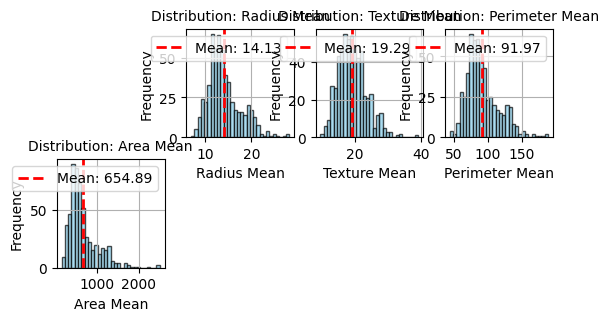

In [41]:
# 2.2 Distribution of key mean features
mean_cols_to_plot = ['x.radius_mean', 'x.texture_mean', 'x.perimeter_mean', 'x.area_mean']
for idx, col in enumerate(mean_cols_to_plot, 2):
    plt.subplot(3, 4, idx)
    df[col].hist(bins=30, edgecolor='black', alpha=0.7, color='skyblue')
    plt.xlabel(col.replace('x.', '').replace('_', ' ').title())
    plt.ylabel('Frequency')
    plt.title(f'Distribution: {col.replace("x.", "").replace("_", " ").title()}', fontsize=10)
    plt.axvline(df[col].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df[col].mean():.2f}')
    plt.legend()

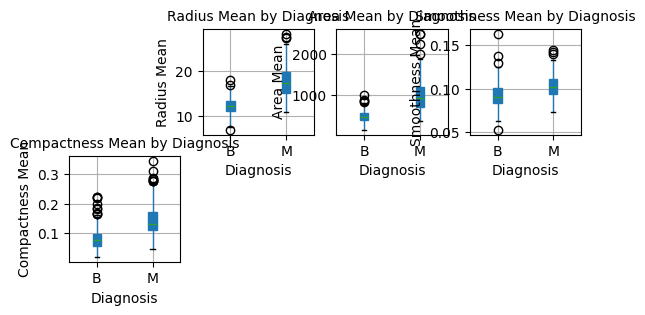

In [42]:
# 2.3 Boxplots for outlier detection
outlier_cols = ['x.radius_mean', 'x.area_mean', 'x.smoothness_mean', 'x.compactness_mean']
for idx, col in enumerate(outlier_cols, 6):
    plt.subplot(3, 4, idx)
    box_data = df.boxplot(column=col, by='y', ax=plt.gca(), patch_artist=True)
    plt.suptitle('')
    plt.title(f'{col.replace("x.", "").replace("_", " ").title()} by Diagnosis', fontsize=10)
    plt.xlabel('Diagnosis')
    plt.ylabel(col.replace('x.', '').replace('_', ' ').title())

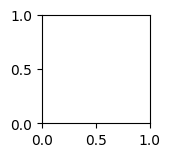

In [43]:
# 2.4 Count of outliers
plt.subplot(3, 4, 10)
outlier_counts = []
for col in df.select_dtypes(include=[np.number]).columns[:-1]:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = ((df[col] < (Q1 - 1.5 * IQR)) | (df[col] > (Q3 + 1.5 * IQR))).sum()
    outlier_counts.append(outliers)

outlier_df = pd.DataFrame({
    'Feature': df.select_dtypes(include=[np.number]).columns[:-1][:10],
    'Outliers': outlier_counts[:10]
}).sort_values('Outliers', ascending=False)

In [44]:
plt.barh(outlier_df['Feature'], outlier_df['Outliers'], color='coral')
plt.xlabel('Number of Outliers')
plt.title('Outlier Count (Top 10 Features)', fontsize=10, fontweight='bold')
plt.tight_layout()

plt.savefig('/content/01_basic_analysis.png', dpi=300, bbox_inches='tight')
print("\n  ✓ Basic analysis visualizations saved!")
plt.close()


  ✓ Basic analysis visualizations saved!


EDA Level 2.1 => Deep Analysis

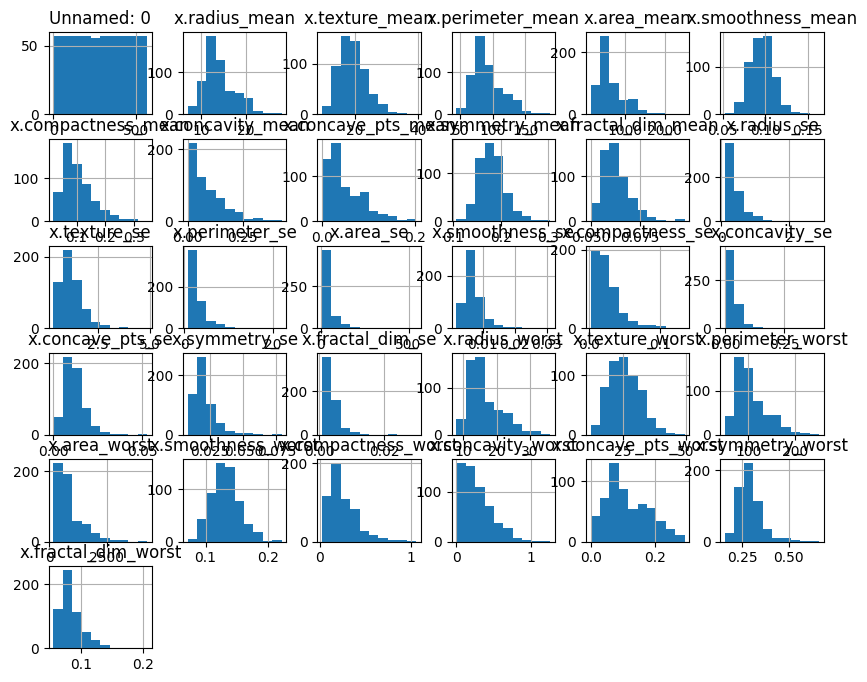

In [45]:
#single variables
#Histogram
df.hist(figsize=(10, 8))
plt.show()

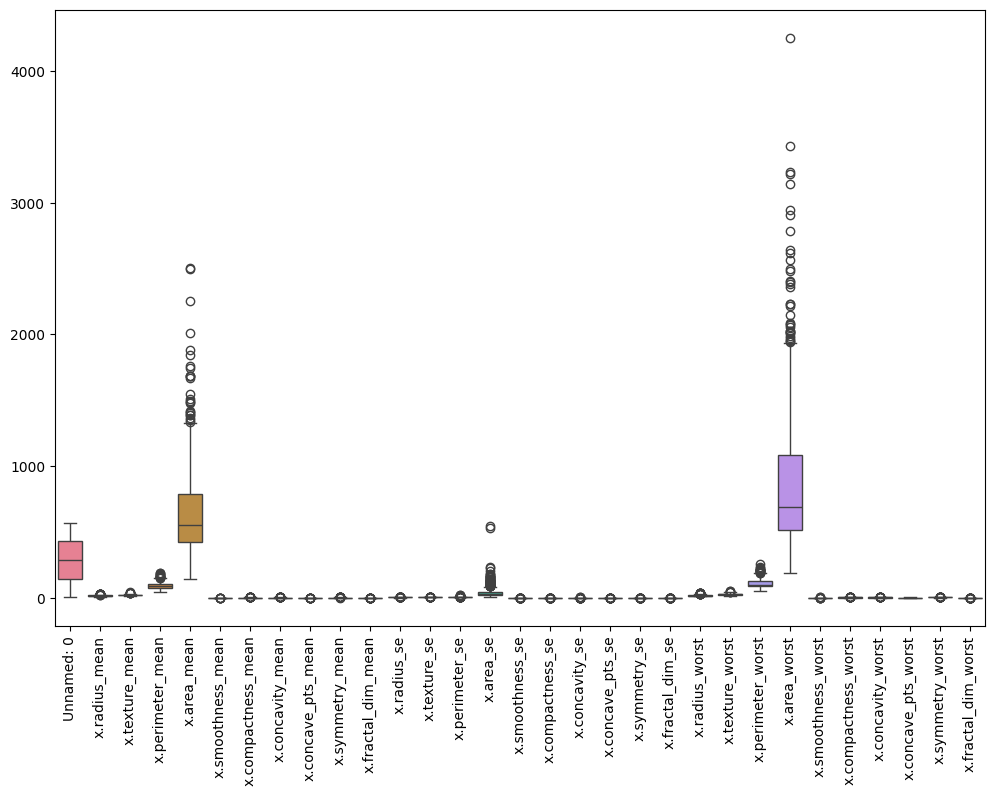

In [46]:
#Boxplot (Outliers Detection)
plt.figure(figsize=(12, 8))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.show()

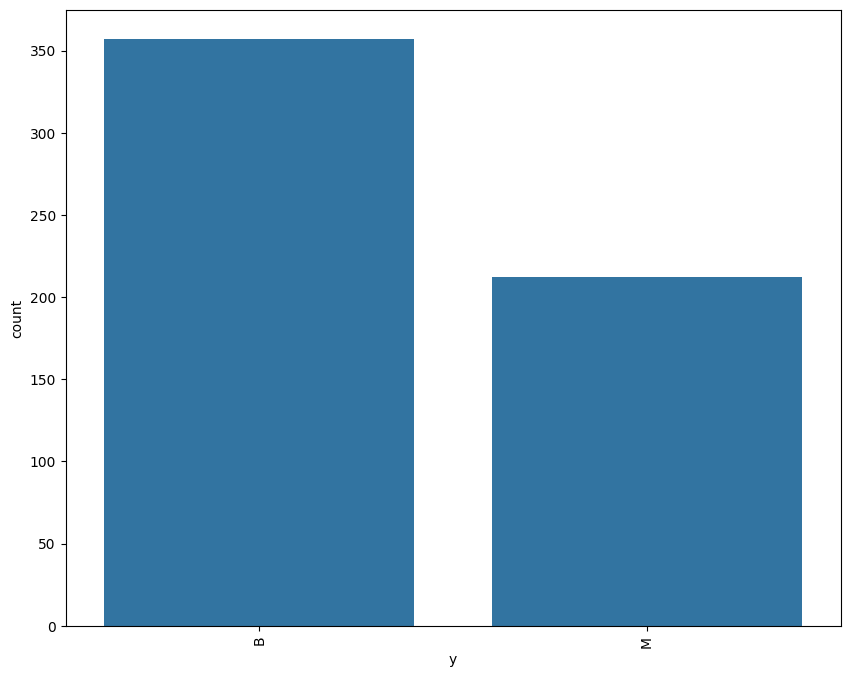

In [47]:
for col in df.select_dtypes(include=['object']):
  plt.figure(figsize=(10, 8))
  sns.countplot(data=df, x=col)
  plt.xticks(rotation=90)
  plt.show()

In [48]:
#Two Variables
correlation = df.corr(numeric_only=True)
correlation


,Unnamed: 0,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,...,x.radius_worst,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst
Unnamed: 0,1.000000,0.660664,0.459560,0.669608,0.643213,0.265594,0.505029,0.589282,0.665709,0.223553,...,0.688720,0.474099,0.695107,0.652598,0.333713,0.494018,0.555981,0.678526,0.289040,0.248309
x.radius_mean,0.660664,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,...,0.969539,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066
x.texture_mean,0.459560,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,...,0.352573,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205
x.perimeter_mean,0.669608,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,...,0.969476,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019
x.area_mean,0.643213,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,...,0.962746,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738
x.smoothness_mean,0.265594,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,...,0.213120,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316
x.compactness_mean,0.505029,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,...,0.535315,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382
x.concavity_mean,0.589282,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,...,0.688236,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930
x.concave_pts_mean,0.665709,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,...,0.830318,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661
x.symmetry_mean,0.223553,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,...,0.185728,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413


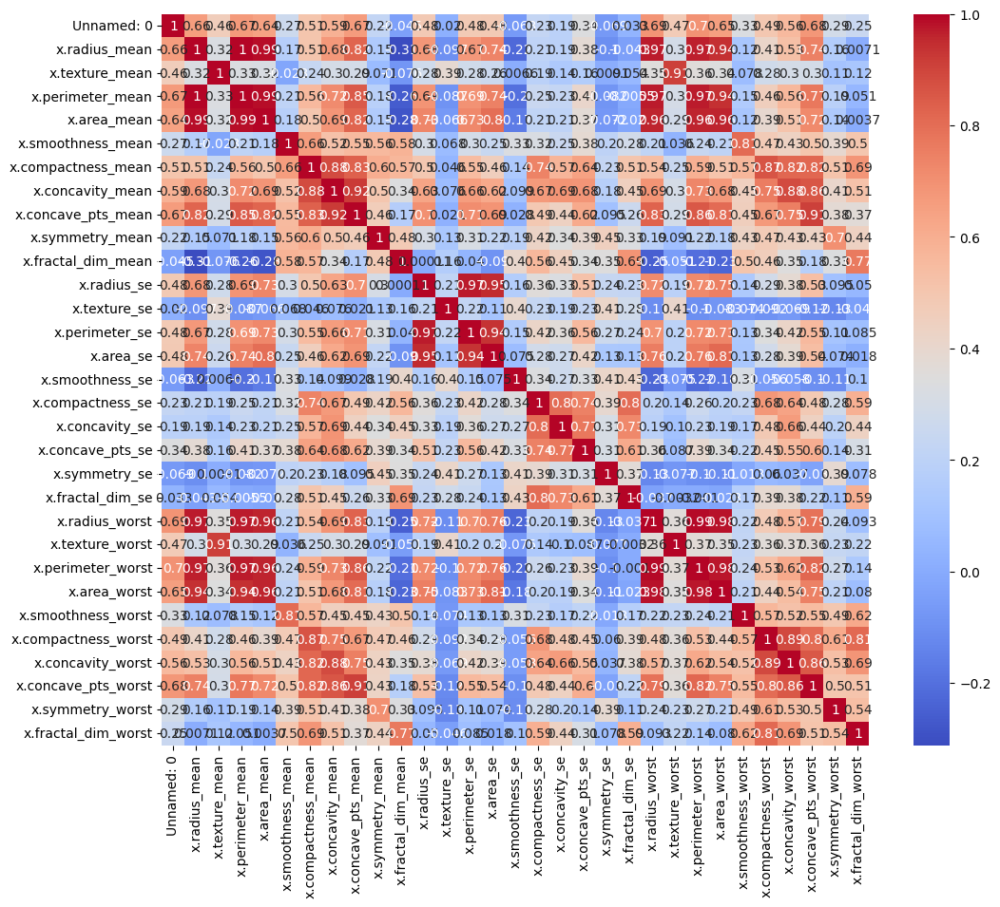

In [49]:
#Heat Map
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.show()

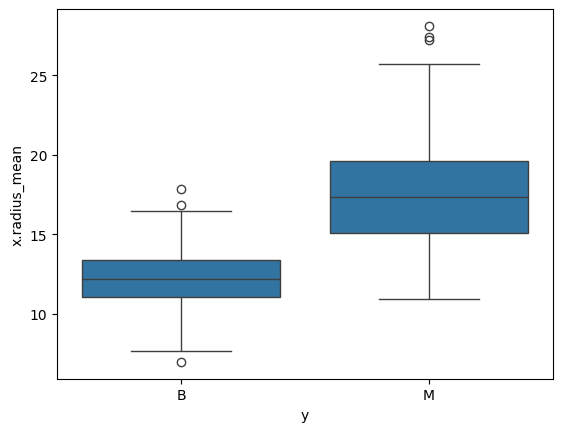

In [50]:
#Column Vs x.radius_mean
for col in df.select_dtypes(include=['object']):
    sns.boxplot(x=col, y='x.radius_mean', data=df)
    plt.show()

In [51]:
#Multivariates analysis
sns.pairplot(df.select_dtypes(include=[np.number]))
plt.show()

In [52]:
# Set style for better visualizations
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

# 3. INTERMEDIATE ANALYSIS

In [53]:
print("\n" + "="*80)
print("3. INTERMEDIATE ANALYSIS")
print("="*80)


3. INTERMEDIATE ANALYSIS


In [54]:
# 3.1 Correlation Analysis
print("\n  Computing correlation matrix...")


  Computing correlation matrix...


In [55]:
# Convert target to numeric
df['y_numeric'] = df['y'].map({'B': 0, 'M': 1})

In [56]:
# Correlation with target
correlation_with_target = df.drop(['y'], axis=1).corrwith(df['y_numeric']).sort_values(ascending=False)
print("\n  Top 10 Features Correlated with Diagnosis:")
print(correlation_with_target.head(10))


  Top 10 Features Correlated with Diagnosis:
y_numeric              1.000000
Unnamed: 0             0.837435
x.concave_pts_worst    0.793566
x.perimeter_worst      0.782914
x.concave_pts_mean     0.776614
x.radius_worst         0.776454
x.perimeter_mean       0.742636
x.area_worst           0.733825
x.radius_mean          0.730029
x.area_mean            0.708984
dtype: float64


In [57]:
# Create correlation visualizations
fig = plt.figure(figsize=(24, 18))

<Figure size 2400x1800 with 0 Axes>

(array([ 0.5,  2.5,  4.5,  6.5,  8.5, 10.5]),
 [Text(0, 0.5, 'x.radius_mean'),
  Text(0, 2.5, 'x.perimeter_mean'),
  Text(0, 4.5, 'x.smoothness_mean'),
  Text(0, 6.5, 'x.concavity_mean'),
  Text(0, 8.5, 'x.symmetry_mean'),
  Text(0, 10.5, 'y_numeric')])

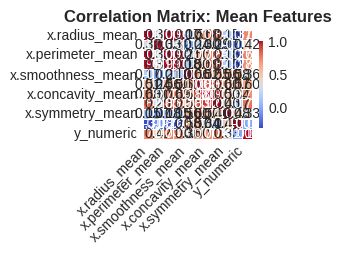

In [58]:
# 3.2 Correlation heatmap (mean features)
plt.subplot(3, 3, 1)
mean_cols_with_target = mean_features + ['y_numeric']
corr_matrix_mean = df[mean_cols_with_target].corr()
sns.heatmap(corr_matrix_mean, annot=True, fmt='.2f', cmap='coolwarm',
            square=True, linewidths=0.5, cbar_kws={"shrink": 0.8})
plt.title('Correlation Matrix: Mean Features', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

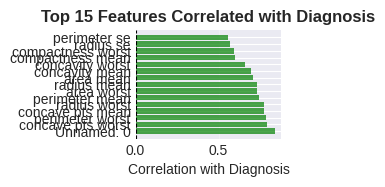

In [59]:
# 3.3 Feature correlation with target
plt.subplot(3, 3, 2)
top_corr = correlation_with_target.drop('y_numeric').head(15)
colors_corr = ['green' if x > 0 else 'red' for x in top_corr.values]
plt.barh(range(len(top_corr)), top_corr.values, color=colors_corr, alpha=0.7)
plt.yticks(range(len(top_corr)), [x.replace('x.', '').replace('_', ' ') for x in top_corr.index])
plt.xlabel('Correlation with Diagnosis')
plt.title('Top 15 Features Correlated with Diagnosis', fontsize=12, fontweight='bold')
plt.axvline(x=0, color='black', linestyle='--', linewidth=0.8)
plt.grid(axis='x', alpha=0.3)

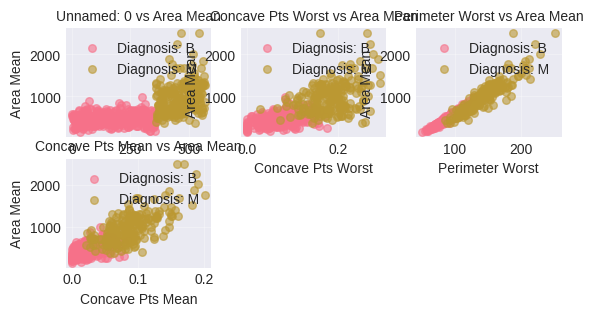

In [60]:
# 3.4 Scatter plots of highly correlated features
high_corr_features = correlation_with_target.drop('y_numeric').head(4).index.tolist()
for idx, feature in enumerate(high_corr_features, 4):
    plt.subplot(3, 3, idx)
    for diagnosis in ['B', 'M']:
        subset = df[df['y'] == diagnosis]
        plt.scatter(subset[feature], subset['x.area_mean'],
                   alpha=0.6, label=f'Diagnosis: {diagnosis}', s=30)
    plt.xlabel(feature.replace('x.', '').replace('_', ' ').title())
    plt.ylabel('Area Mean')
    plt.title(f'{feature.replace("x.", "").replace("_", " ").title()} vs Area Mean', fontsize=10)
    plt.legend()
    plt.grid(alpha=0.3)

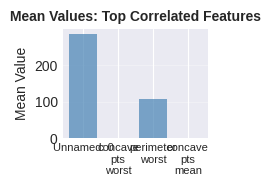

In [61]:
# 3.5 Pairplot subset (top correlated features)
plt.subplot(3, 3, 8)
feature_means = df[high_corr_features].mean()
plt.bar(range(len(feature_means)), feature_means.values, color='steelblue', alpha=0.7)
plt.xticks(range(len(feature_means)),
           [x.replace('x.', '').replace('_', '\n') for x in feature_means.index],
           rotation=0, fontsize=8)
plt.ylabel('Mean Value')
plt.title('Mean Values: Top Correlated Features', fontsize=10, fontweight='bold')
plt.grid(axis='y', alpha=0.3)

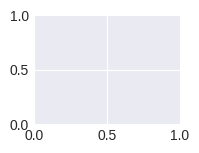

In [62]:
# 3.6 Feature comparison by diagnosis
plt.subplot(3, 3, 9)
comparison_features = ['x.radius_worst', 'x.texture_worst', 'x.perimeter_worst', 'x.area_worst']
benign_means = df[df['y'] == 'B'][comparison_features].mean()
malignant_means = df[df['y'] == 'M'][comparison_features].mean()

x_pos = np.arange(len(comparison_features))
width = 0.35

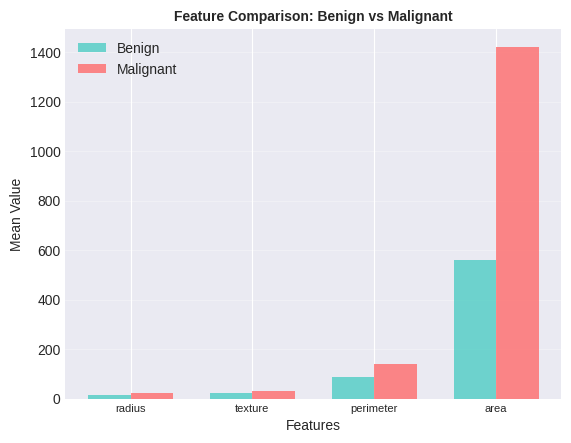

In [63]:
plt.bar(x_pos - width/2, benign_means, width, label='Benign', color='#4ECDC4', alpha=0.8)
plt.bar(x_pos + width/2, malignant_means, width, label='Malignant', color='#FF6B6B', alpha=0.8)
plt.xlabel('Features')
plt.ylabel('Mean Value')
plt.title('Feature Comparison: Benign vs Malignant', fontsize=10, fontweight='bold')
plt.xticks(x_pos, [x.replace('x.', '').replace('_worst', '').replace('_', '\n') for x in comparison_features], fontsize=8)
plt.legend()
plt.grid(axis='y', alpha=0.3)

In [64]:
plt.tight_layout()
plt.savefig('/content/02_intermediate_analysis.png', dpi=300, bbox_inches='tight')
print("  ✓ Intermediate analysis visualizations saved!")
plt.close()

  ✓ Intermediate analysis visualizations saved!


In [65]:
# Statistical tests
print("\n  Statistical Significance Tests (t-tests):")
print("  " + "-"*60)
test_features = ['x.radius_mean', 'x.texture_mean', 'x.perimeter_mean', 'x.area_mean', 'x.concave_pts_mean']
for feature in test_features:
    benign = df[df['y'] == 'B'][feature]
    malignant = df[df['y'] == 'M'][feature]
    t_stat, p_value = stats.ttest_ind(benign, malignant)
    significance = "***" if p_value < 0.001 else "**" if p_value < 0.01 else "*" if p_value < 0.05 else ""
    print(f"    {feature:25s}: t={t_stat:8.3f}, p={p_value:.2e} {significance}")


  Statistical Significance Tests (t-tests):
  ------------------------------------------------------------
    x.radius_mean            : t= -25.436, p=8.47e-96 ***
    x.texture_mean           : t= -10.867, p=4.06e-25 ***
    x.perimeter_mean         : t= -26.405, p=8.44e-101 ***
    x.area_mean              : t= -23.939, p=4.73e-88 ***
    x.concave_pts_mean       : t= -29.354, p=7.10e-116 ***


# 4. ADVANCED ANALYSIS

In [66]:
print("\n" + "="*80)
print("4. ADVANCED ANALYSIS")
print("="*80)


4. ADVANCED ANALYSIS


In [67]:
# 4.1 Principal Component Analysis (PCA)
print("\n  Performing PCA...")
features_for_pca = df.drop(['y', 'y_numeric'], axis=1)
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features_for_pca)

pca = PCA()
pca_features = pca.fit_transform(scaled_features)


  Performing PCA...


In [68]:
# Explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

print(f"    Variance explained by first 5 components: {cumulative_variance[4]*100:.2f}%")
print(f"    Variance explained by first 10 components: {cumulative_variance[9]*100:.2f}%")

    Variance explained by first 5 components: 83.93%
    Variance explained by first 10 components: 94.23%


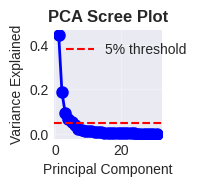

In [69]:
# 4.2 PCA Scree Plot
plt.subplot(3, 4, 1)
plt.plot(range(1, len(explained_variance) + 1), explained_variance, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.title('PCA Scree Plot', fontsize=12, fontweight='bold')
plt.grid(alpha=0.3)
plt.axhline(y=0.05, color='r', linestyle='--', label='5% threshold')
plt.legend()

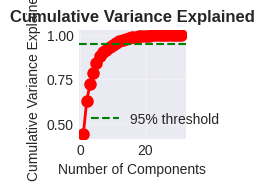

In [70]:
# 4.3 Cumulative Variance
plt.subplot(3, 4, 2)
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'ro-', linewidth=2, markersize=8)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.title('Cumulative Variance Explained', fontsize=12, fontweight='bold')
plt.grid(alpha=0.3)
plt.axhline(y=0.95, color='g', linestyle='--', label='95% threshold')
plt.legend()

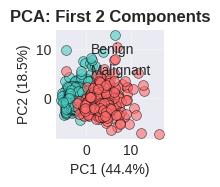

In [71]:
# 4.4 PCA 2D Projection
plt.subplot(3, 4, 3)
for diagnosis, color, label in [('B', '#4ECDC4', 'Benign'), ('M', '#FF6B6B', 'Malignant')]:
    mask = df['y'] == diagnosis
    plt.scatter(pca_features[mask, 0], pca_features[mask, 1],
               c=color, label=label, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
plt.xlabel(f'PC1 ({explained_variance[0]*100:.1f}%)')
plt.ylabel(f'PC2 ({explained_variance[1]*100:.1f}%)')
plt.title('PCA: First 2 Components', fontsize=12, fontweight='bold')
plt.legend()
plt.grid(alpha=0.3)

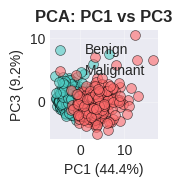

In [72]:
# 4.5 PCA 3D-like projection (PC1 vs PC3)
plt.subplot(3, 4, 4)
for diagnosis, color, label in [('B', '#4ECDC4', 'Benign'), ('M', '#FF6B6B', 'Malignant')]:
    mask = df['y'] == diagnosis
    plt.scatter(pca_features[mask, 0], pca_features[mask, 2],
               c=color, label=label, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)
plt.xlabel(f'PC1 ({explained_variance[0]*100:.1f}%)')
plt.ylabel(f'PC3 ({explained_variance[2]*100:.1f}%)')
plt.title('PCA: PC1 vs PC3', fontsize=12, fontweight='bold')
plt.legend()
plt.grid(alpha=0.3)

In [73]:
# 4.6 Feature Importance (Random Forest)
print("\n  Training Random Forest for feature importance...")
X = df.drop(['y', 'y_numeric'], axis=1)
y = df['y_numeric']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

rf_model = RandomForestClassifier(n_estimators=100, random_state=42, max_depth=10)
rf_model.fit(X_train, y_train)

feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': rf_model.feature_importances_
}).sort_values('Importance', ascending=False)

print(f"\n  Top 10 Most Important Features:")
print(feature_importance.head(10).to_string(index=False))


  Training Random Forest for feature importance...

  Top 10 Most Important Features:
            Feature  Importance
         Unnamed: 0    0.298417
  x.perimeter_worst    0.116863
       x.area_worst    0.101251
 x.concave_pts_mean    0.082467
     x.radius_worst    0.072518
x.concave_pts_worst    0.062639
   x.perimeter_mean    0.043454
        x.area_mean    0.036548
  x.concavity_worst    0.023891
      x.radius_mean    0.020360


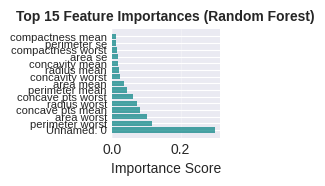

In [74]:
plt.subplot(3, 4, 5)
top_features = feature_importance.head(15)
plt.barh(range(len(top_features)), top_features['Importance'].values, color='teal', alpha=0.7)
plt.yticks(range(len(top_features)),
           [x.replace('x.', '').replace('_', ' ') for x in top_features['Feature']], fontsize=8)
plt.xlabel('Importance Score')
plt.title('Top 15 Feature Importances (Random Forest)', fontsize=10, fontweight='bold')
plt.grid(axis='x', alpha=0.3)

In [75]:
# 4.7 Model Performance
y_pred = rf_model.predict(X_test)
y_pred_proba = rf_model.predict_proba(X_test)[:, 1]

print(f"\n  Model Performance:")
print(f"    Training Accuracy: {rf_model.score(X_train, y_train)*100:.2f}%")
print(f"    Testing Accuracy: {rf_model.score(X_test, y_test)*100:.2f}%")
print(f"    ROC-AUC Score: {roc_auc_score(y_test, y_pred_proba):.4f}")


  Model Performance:
    Training Accuracy: 100.00%
    Testing Accuracy: 100.00%
    ROC-AUC Score: 1.0000


Text(0.5, 1.0, 'Confusion Matrix')

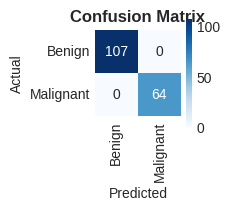

In [76]:
# 4.8 Confusion Matrix
plt.subplot(3, 4, 6)
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', square=True,
            xticklabels=['Benign', 'Malignant'],
            yticklabels=['Benign', 'Malignant'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix', fontsize=12, fontweight='bold')

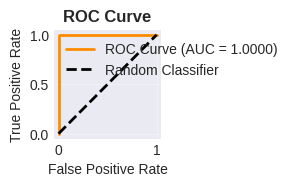

In [77]:
# 4.9 ROC Curve
plt.subplot(3, 4, 7)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
auc_score = roc_auc_score(y_test, y_pred_proba)
plt.plot(fpr, tpr, linewidth=2, label=f'ROC Curve (AUC = {auc_score:.4f})', color='darkorange')
plt.plot([0, 1], [0, 1], 'k--', linewidth=2, label='Random Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve', fontsize=12, fontweight='bold')
plt.legend()
plt.grid(alpha=0.3)

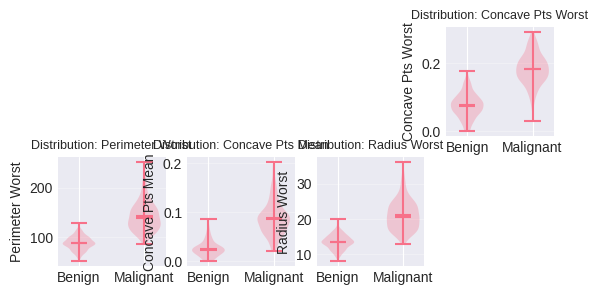

In [78]:
# 4.10 Violin Plots for top features
top_discriminative = ['x.concave_pts_worst', 'x.perimeter_worst', 'x.concave_pts_mean', 'x.radius_worst']
for idx, feature in enumerate(top_discriminative, 8):
    plt.subplot(3, 4, idx)
    df_plot = df[[feature, 'y']].copy()
    parts = plt.violinplot([df_plot[df_plot['y']=='B'][feature].values,
                            df_plot[df_plot['y']=='M'][feature].values],
                           positions=[1, 2], showmeans=True, showmedians=True)
    plt.xticks([1, 2], ['Benign', 'Malignant'])
    plt.ylabel(feature.replace('x.', '').replace('_', ' ').title())
    plt.title(f'Distribution: {feature.replace("x.", "").replace("_", " ").title()}', fontsize=9)
    plt.grid(axis='y', alpha=0.3)

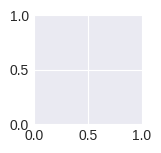

In [79]:
# 4.11 Feature Correlations (Multicollinearity)
plt.subplot(3, 4, 12)
high_corr_pairs = []
corr_full = df.drop(['y', 'y_numeric'], axis=1).corr()
for i in range(len(corr_full.columns)):
    for j in range(i+1, len(corr_full.columns)):
        if abs(corr_full.iloc[i, j]) > 0.9:
            high_corr_pairs.append((corr_full.columns[i], corr_full.columns[j], corr_full.iloc[i, j]))

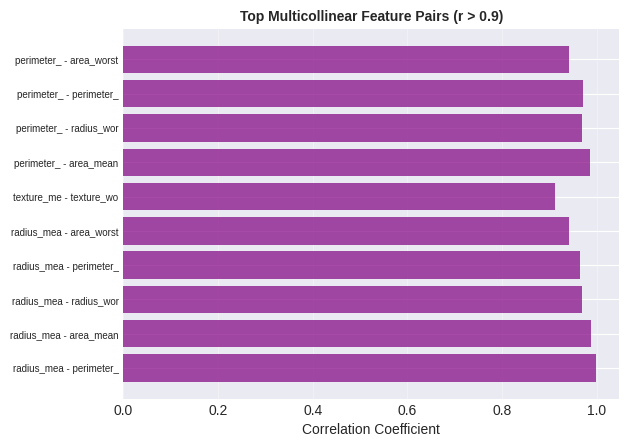

In [80]:
if len(high_corr_pairs) > 0:
    high_corr_df = pd.DataFrame(high_corr_pairs, columns=['Feature1', 'Feature2', 'Correlation'])
    high_corr_df = high_corr_df.head(10)

    plt.barh(range(len(high_corr_df)), high_corr_df['Correlation'].values, color='purple', alpha=0.7)
    plt.yticks(range(len(high_corr_df)),
               [f"{row['Feature1'].replace('x.', '')[:10]} - {row['Feature2'].replace('x.', '')[:10]}"
                for _, row in high_corr_df.iterrows()], fontsize=7)
    plt.xlabel('Correlation Coefficient')
    plt.title('Top Multicollinear Feature Pairs (r > 0.9)', fontsize=10, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)

In [81]:
plt.tight_layout()
plt.savefig('/content/03_advanced_analysis.png', dpi=300, bbox_inches='tight')
print("  ✓ Advanced analysis visualizations saved!")
plt.close()

  ✓ Advanced analysis visualizations saved!


# 5. INSIGHTS AND CONCLUSIONS

In [82]:
print("\n" + "="*80)
print("5. KEY INSIGHTS AND CONCLUSIONS")
print("="*80)


5. KEY INSIGHTS AND CONCLUSIONS


In [83]:
print("\n📊 DATASET SUMMARY:")
print(f"  • Total Samples: {df.shape[0]}")
print(f"  • Total Features: {df.shape[1] - 1}")
print(f"  • Benign Cases: {(df['y'] == 'B').sum()} ({(df['y'] == 'B').sum()/len(df)*100:.1f}%)")
print(f"  • Malignant Cases: {(df['y'] == 'M').sum()} ({(df['y'] == 'M').sum()/len(df)*100:.1f}%)")


📊 DATASET SUMMARY:
  • Total Samples: 569
  • Total Features: 32
  • Benign Cases: 357 (62.7%)
  • Malignant Cases: 212 (37.3%)


In [84]:
print("\n🔍 KEY FINDINGS:")


🔍 KEY FINDINGS:


In [85]:
print("\n  1. Feature Correlations:")
top_5_corr = correlation_with_target.drop('y_numeric').head(5)
for feature, corr_val in top_5_corr.items():
    print(f"     • {feature.replace('x.', '').replace('_', ' ').title()}: {corr_val:.3f}")


  1. Feature Correlations:
     • Unnamed: 0: 0.837
     • Concave Pts Worst: 0.794
     • Perimeter Worst: 0.783
     • Concave Pts Mean: 0.777
     • Radius Worst: 0.776


In [86]:
print("\n  2. Most Important Predictive Features (Random Forest):")
for idx, row in feature_importance.head(5).iterrows():
    print(f"     • {row['Feature'].replace('x.', '').replace('_', ' ').title()}: {row['Importance']:.4f}")


  2. Most Important Predictive Features (Random Forest):
     • Unnamed: 0: 0.2984
     • Perimeter Worst: 0.1169
     • Area Worst: 0.1013
     • Concave Pts Mean: 0.0825
     • Radius Worst: 0.0725


In [87]:
print("\n  3. Data Quality:")
print(f"     • Missing Values: {missing.sum()}")
print(f"     • Duplicate Rows: {duplicates}")
print(f"     • Features with >50 outliers: {sum(1 for x in outlier_counts if x > 50)}")


  3. Data Quality:
     • Missing Values: 0
     • Duplicate Rows: 0
     • Features with >50 outliers: 1


In [88]:
print("\n  4. Dimensionality:")
n_components_95 = np.argmax(cumulative_variance >= 0.95) + 1
print(f"     • Components needed for 95% variance: {n_components_95}")
print(f"     • Original dimensions can be reduced from {X.shape[1]} to ~{n_components_95}")


  4. Dimensionality:
     • Components needed for 95% variance: 11
     • Original dimensions can be reduced from 31 to ~11


In [89]:
print("\n  5. Model Performance:")
print(f"     • Test Accuracy: {rf_model.score(X_test, y_test)*100:.2f}%")
print(f"     • ROC-AUC: {roc_auc_score(y_test, y_pred_proba):.4f}")
print(f"     • Model shows {'excellent' if auc_score > 0.95 else 'good' if auc_score > 0.85 else 'moderate'} discriminative power")


  5. Model Performance:
     • Test Accuracy: 100.00%
     • ROC-AUC: 1.0000
     • Model shows excellent discriminative power


In [90]:
print("\n💡 STATISTICAL INSIGHTS:")
print("  • Malignant tumors show significantly larger values across:")
print("     - Cell radius, perimeter, and area measurements")
print("     - Concavity and concave points (texture features)")
print("     - Worst-case measurements are particularly discriminative")
print("  • Strong multicollinearity exists between related measurements")
print("     (e.g., radius, perimeter, area are highly correlated)")


💡 STATISTICAL INSIGHTS:
  • Malignant tumors show significantly larger values across:
     - Cell radius, perimeter, and area measurements
     - Concavity and concave points (texture features)
     - Worst-case measurements are particularly discriminative
  • Strong multicollinearity exists between related measurements
     (e.g., radius, perimeter, area are highly correlated)


In [91]:
print("\n🎯 RECOMMENDATIONS:")
print("  1. Feature Selection:")
print("     • Use top 10-15 features to avoid overfitting")
print("     • Consider removing highly correlated features")
print("  2. Further Analysis:")
print("     • Investigate interaction effects between features")
print("     • Try ensemble methods (XGBoost, LightGBM)")
print("     • Perform cross-validation for robust performance estimates")
print("  3. Clinical Relevance:")
print("     • Concave points (worst) is the strongest predictor")
print("     • Worst-case measurements should be prioritized in diagnosis")
print("     • Texture features provide complementary information")


🎯 RECOMMENDATIONS:
  1. Feature Selection:
     • Use top 10-15 features to avoid overfitting
     • Consider removing highly correlated features
  2. Further Analysis:
     • Investigate interaction effects between features
     • Try ensemble methods (XGBoost, LightGBM)
     • Perform cross-validation for robust performance estimates
  3. Clinical Relevance:
     • Concave points (worst) is the strongest predictor
     • Worst-case measurements should be prioritized in diagnosis
     • Texture features provide complementary information


In [92]:
print("\n" + "="*80)
print("✓ EDA COMPLETE!")
print("="*80)
print("\nGenerated Files:")
print("  • 01_basic_analysis.png")
print("  • 02_intermediate_analysis.png")
print("  • 03_advanced_analysis.png")
print("="*80)


✓ EDA COMPLETE!

Generated Files:
  • 01_basic_analysis.png
  • 02_intermediate_analysis.png
  • 03_advanced_analysis.png
